In [3]:
# !pip install adjustText

from matplotlib        import collections             as matcoll
# from matplotlib.colors import LinearSegmentedColormap
# from matplotlib.colors import TwoSlopeNorm
# from matplotlib.pyplot import rc_context
from scipy.cluster     import hierarchy
# from adjustText        import adjust_text

import matplotlib.pyplot as plt
# import matplotlib
import seaborn as sns
import scanpy as sc
import pandas as pd
import numpy as np
# import math
# import glob
# import h5py
import sys
import os

main_path = '/mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning'
import warnings
warnings.filterwarnings("ignore")

sys.path.append(main_path)
# from models.clustering.logistic_regression_leiden_clusters import *
from models.evaluation.folds import load_existing_split
from models.clustering.correlations import *
from models.clustering.data_processing import *
# from models.clustering.leiden_representations import include_tile_connections_frame
# from data_manipulation.utils import store_data
from IPython.display import clear_output
clear_output()


### Setting variables

In [3]:
# Resolution and fold for the tile clustering and slide representations.
resolution     = 2.0
fold_number    = 4
groupby        = 'leiden_%s' % resolution

# Folder run.
dataset     = 'Meso'
additional_dataset = 'TCGA_MESO'
meta_folder     = '750K'
matching_field  = 'slides'


# Pickle files.
folds_pickle = '{}/files/pkl_{}_he_test_train_slides.pkl'.format(main_path, dataset)

# Tile representation files.
h5_complete_path   = '{}/results/BarlowTwins_3/{}/h224_w224_n3_zdim128/hdf5_{}_he_complete_filtered_metadata.h5'.format(main_path, dataset, dataset)
h5_additional_path = '{}/results/BarlowTwins_3/{}/h224_w224_n3_zdim128/hdf5_{}_he_complete_filtered_metadata.h5'.format(main_path, additional_dataset, additional_dataset)
figure_path = main_path + '/workflow/figures/HPC_figures/'
os.makedirs(figure_path, exist_ok=True)
main_cluster_path = h5_complete_path.split('hdf5_')[0]
main_cluster_path = os.path.join(main_cluster_path, meta_folder)
adatas_path       = os.path.join(main_cluster_path, 'adatas')

,Info,count(%)
0,Stage,
0,N0,136 (26.56%)
1,N1,211 (41.21%)
2,N2,1 (0.2%)
3,Nx,164 (32.03%)
0,T_Stage,
0,T1a,6 (1.17%)
1,T1b,19 (3.71%)
2,T2,94 (18.36%)
3,T3,180 (35.16%)


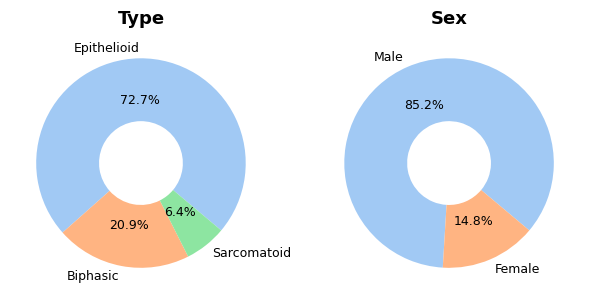

In [40]:
lattic_clinical = pd.read_csv(f'{main_path}/files/Meso_patients.csv')
col_list = ['Stage', 'T_Stage', 'TNM_Stage','smoking_history', 'wcc_score', 'desmoplastic_component', 'confident_diagnosis', 'HB_score']
df = pd.DataFrame()
for col in col_list:
    row = pd.DataFrame(lattic_clinical[col].value_counts().apply(lambda x: str(str(x)+' ('+ str(round(x/len(lattic_clinical)*100, 2)))+'%)').sort_index()).reset_index()
    header_row = pd.DataFrame([[col, '']], columns=['Info', 'count(%)'])
    row = row.rename(columns={col: 'Info', 'count': 'count(%)'})
    row = pd.concat([header_row, row], axis=0)
    df = pd.concat([df, row], axis=0)

df.to_csv(f'{figure_path}/dataset_info.csv', index=False)
display(df)


col_list = ['type', 'Sex']
fig, ax = plt.subplots(1,2, figsize=(6,4))
ax = ax.flatten()
bbox_props = dict(boxstyle="Round,pad=0.6", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, col in enumerate(col_list):
    ax[i].pie(lattic_clinical[col].value_counts(), autopct='%1.1f%%', wedgeprops=dict(width=0.6), startangle=-40, colors=sns.color_palette("pastel"), labels = lattic_clinical[col].value_counts().index.to_list(), textprops=dict(fontsize=9))
    ax[i].set_title(str.capitalize(col), fontsize=13, fontweight='bold')
    label_list = lattic_clinical[col].value_counts().index.to_list()
    # for j, p in enumerate(wedges):
    #     ang = (p.theta2 - p.theta1)/2. + p.theta1
    #     y = np.sin(np.deg2rad(ang))
    #     x = np.cos(np.deg2rad(ang))
    #     horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    #     connectionstyle = f"angle,angleA=0,angleB={ang}"
    #     kw["arrowprops"].update({"connectionstyle": connectionstyle})
    #     ax[i].annotate(label_list[j], xy=(x, y), xytext=(1.35*np.sign(x), 1.4*y),
    #                 horizontalalignment=horizontalalignment, **kw, fontsize=30, fontweight='bold')

plt.tight_layout()
plt.savefig(f'{figure_path}/pie_chart_dataset.png')


### UMAP for HPCs

In [5]:
# PAGA.
adata_train, h5ad_path = read_h5ad_reference(h5_complete_path, meta_folder, groupby, fold_number)

if os.path.isfile(h5ad_path.replace('.h5ad', '_paga.h5ad')):
    adata_train = anndata.read_h5ad(h5ad_path.replace('.h5ad', '_paga.h5ad'))
else:
    sc.tl.paga(adata_train, groups=groupby, neighbors_key='nn_leiden')
    # sc.pl.paga(adata_train, layout='rt_circular', random_state=0, threshold=0.29, single_component=True, node_size_scale=15, node_size_power=1,
            # edge_width_scale=0.2, fontsize=10, fontoutline=5, frameon=False, show=True)
    # rsc.tl.umap(adata_train, neighbors_key='nn_leiden')
    sc.tl.umap(adata_train, init_pos="paga", neighbors_key='nn_leiden')
    sc.tl.tsne(adata_train, use_rep='X', perplexity=50, learning_rate=1000, random_state=42)
    adata_train.write(h5ad_path.replace('.h5ad', '_paga.h5ad'))

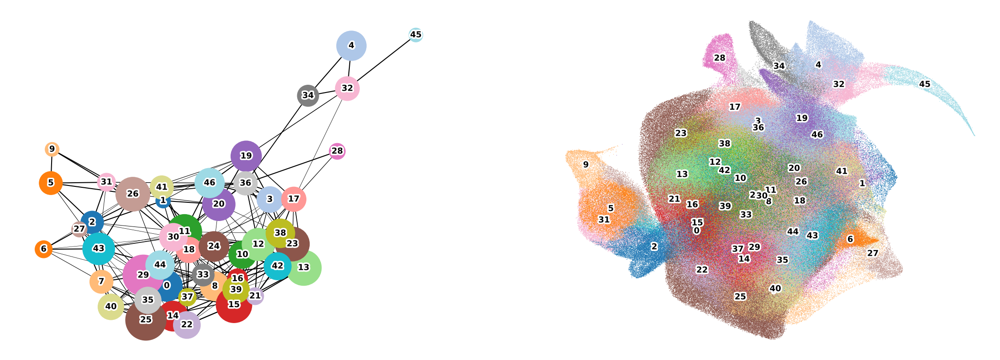

In [4]:
# Graph sahpe.
import matplotlib
fig = plt.figure(figsize=(28,10))
ax  = fig.add_subplot(1, 2, 1)
sc.pl.paga(adata_train, random_state=0, threshold=0.29,single_component=True, node_size_scale=15, node_size_power=1,
            edge_width_scale=0.2, fontsize=13, fontoutline=5, frameon=False, show=False, ax=ax, save=False)
ax.invert_yaxis()

ax1 = fig.add_subplot(1, 2, 2)
sc.pl.umap(adata_train, color=groupby, show=False, ax=ax1, legend_loc='on data', frameon=False, palette='tab20', legend_fontsize=13, size=3, legend_fontoutline = 5)
ax1.set_title('')
# plt.show()
plt.savefig(figure_path + '/PAGA_graph_umap.png', dpi=500)


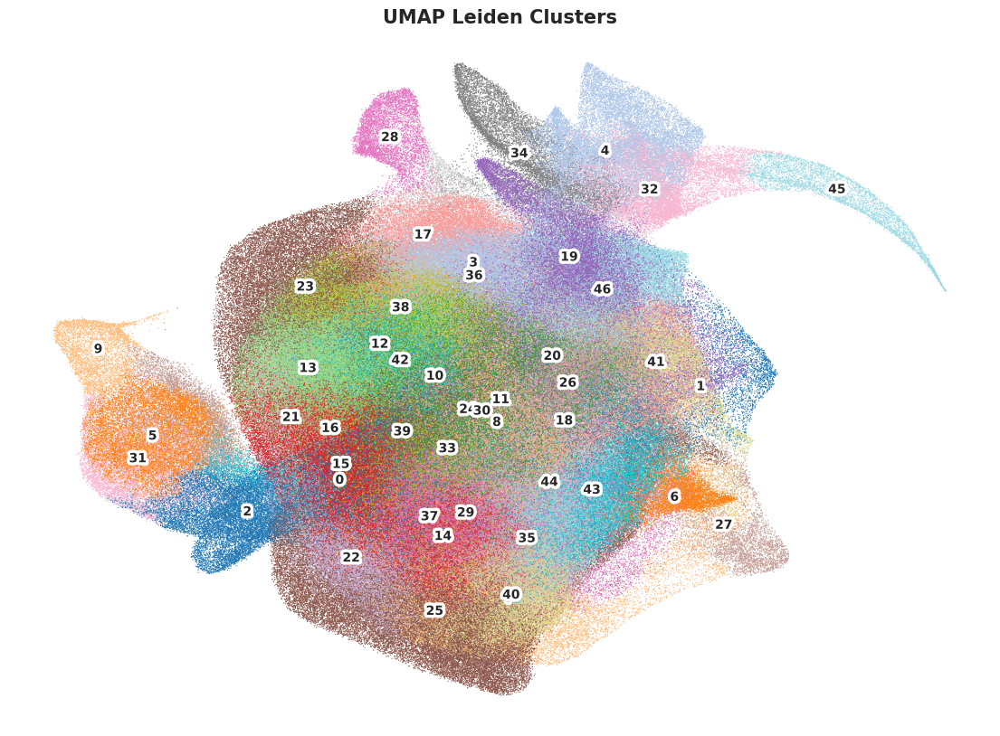

In [7]:
fig = plt.figure(figsize=(14,10))
sns.set_theme(style='white')
ax1 = fig.add_subplot(1, 1, 1)
sc.pl.umap(adata_train, color=groupby, show=False, ax=ax1, legend_loc='on data', frameon=False, palette='tab20', legend_fontsize=10, size=3, legend_fontoutline = 5)
ax1.set_title('UMAP Leiden Clusters', fontsize=15, fontweight='bold')
plt.savefig(figure_path + '/umap_leiden_clusters.png', dpi=500)
# sc.pl.umap(adata_train, show=False, ax=ax1, frameon=False, legend_fontsize=10, size=3)
# plt.savefig(figure_path + '/umap_leiden_clusters_gray_version.png', dpi=500)

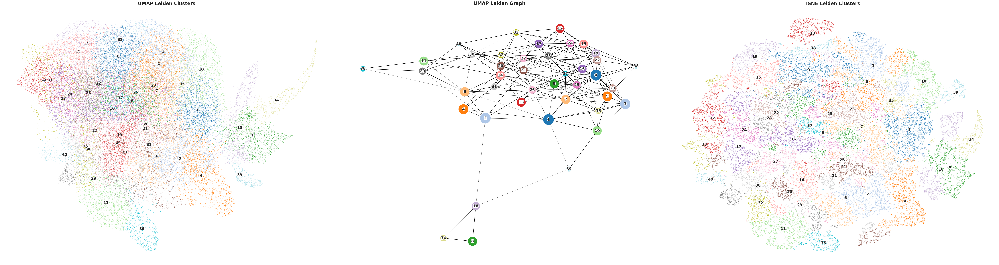

In [ ]:
fig = plt.figure(figsize=(75,20))
sns.set_theme(style='white')

ax1  = fig.add_subplot(1, 3, 1)
sc.pl.umap(adata_train, color=groupby, show=False, ax=ax1, size=5, legend_loc='on data', frameon=False, palette='tab20', legend_fontsize=20)
ax1.set_title('UMAP Leiden Clusters', fontsize=25, fontweight='bold')

ax2  = fig.add_subplot(1, 3, 2)
# # sc.pl.umap(adata_train, color='type', show=False, ax=ax2, size=3,  frameon=False)
# # legend_c = ax2.legend(loc='best', markerscale=1, title='Type', prop={'size': 15})
# # legend_c.get_title().set_fontsize(15)
import matplotlib
t_start = ax2.transData
ax2.set_transform(t_start+matplotlib.transforms.Affine2D().rotate_deg(90))

sc.pl.paga(adata_train, layout='fa', random_state=0, threshold=0.29, single_component=True, node_size_scale=15, node_size_power=1,
            edge_width_scale=0.2, fontsize=20, fontoutline=5, frameon=False, show=False, ax=ax2, save=False)
ax2.set_title('UMAP Leiden Graph', fontsize=25, fontweight='bold')
fig.add_subplot(ax2)


# ax3 = fig.add_subplot(1, 3, 3)
# sc.pl.tsne(adata_train, color=groupby, show=False, ax=ax3, size=5, legend_loc='on data', frameon=False, palette='tab20', legend_fontsize=20)
# # rotate the plot by 180 degrees (down to up)
# ax3.set_ylim(ax3.get_ylim()[::-1])
# ax3.set_title('TSNE Leiden Clusters', fontsize=25, fontweight='bold')
# # plt.savefig(os.path.join(figure_path, 'umap_tsne_leiden_clusters.pdf'))
# plt.show()
# save figure


### SuperCluster figures (tSNE and UMAP)

main_pattern: ['Lung' 'Collagen' 'Solid' 'Nested epithelioid, cold'
 'Complex nested epithelioid' 'Spindle cells and collagen' 'Talc'
 'Packed spindle cells' 'Muscle' 'Packed malignant cells'
 'Inflamed malignancy' 'Nested epithelioid' 'Inflamed' 'Blood' 'Necrosis'
 'Connective tissue']


,Main_pattern,Count,Clusters
0,Lung,59588,"[2, 26, 31, 5, 9]"
1,Collagen,45508,"[17, 28, 3, 36]"
2,Solid,50190,"[25, 40]"
3,"Nested epithelioid, cold",44702,"[33, 39, 8]"
4,Complex nested epithelioid,75263,"[14, 35, 43, 44]"
5,Spindle cells and collagen,93563,"[12, 13, 23, 38]"
6,Talc,47079,"[0, 11]"
7,Packed spindle cells,43029,"[15, 16, 21]"
8,Muscle,45861,"[32, 34, 4, 45]"
9,Packed malignant cells,22677,"[22, 37]"


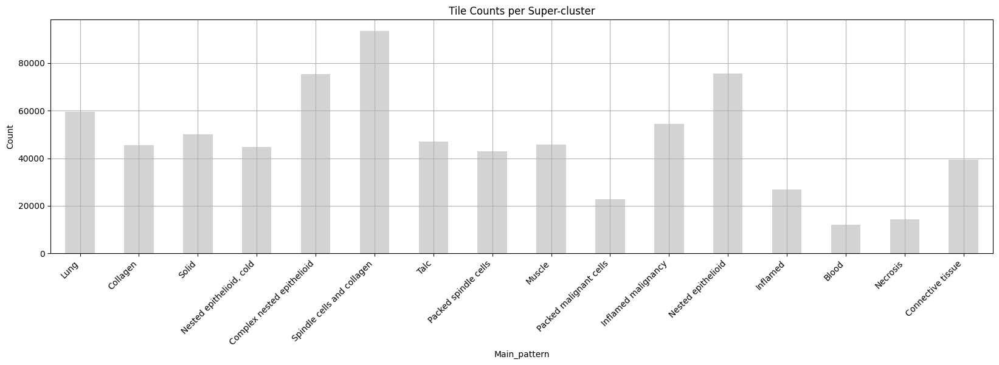

In [6]:
annotations = pd.read_csv('{}/files/meso_annotations_750K.csv'.format(main_path), index_col=0).reset_index()
annotations['main_pattern'] = annotations['main_pattern'].apply(lambda x: x.capitalize())

# adata_train.obs['main_pattern'] = adata_train.obs['leiden_2.0'].apply(lambda x: annotations[annotations['HPC'].astype(str) == x]['main_pattern'].values[0])
# print('Main pattern:', adata_train.obs['main_pattern'].unique())

adata_train.obs['main_pattern'] = adata_train.obs['leiden_2.0'].apply(lambda x: annotations[annotations['HPC'].astype(str) == x]['main_pattern'].values[0])
main_pattern_list = adata_train.obs['main_pattern'].unique()
print('main_pattern:', main_pattern_list)
hpc_groupedby_category = adata_train.obs.groupby('main_pattern')
temp = []
for pattern in main_pattern_list:
    temp.append([pattern, hpc_groupedby_category.get_group(pattern).shape[0], np.unique(hpc_groupedby_category.get_group(pattern)['leiden_2.0'].values, return_counts=True)[0].tolist()])

catg_cluster_df = pd.DataFrame(temp, columns=['Main_pattern', 'Count', 'Clusters'])
fig, ax = plt.subplots(figsize=(20,5))
catg_cluster_df.plot.bar(x='Main_pattern', y='Count', rot=90, fontsize=10, legend=False, title='Tile Counts per Super-cluster', ylabel='Count', grid=True, ax=ax, color='lightgrey')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right');
plt.savefig(os.path.join(figure_path, 'tile_counts_per_super_cluster.png'), bbox_inches='tight')
# catg_cluster_df.to_csv(os.path.join(figure_path, 'tile_counts_per_super_cluster.csv'), index=False)
display(catg_cluster_df)





In [ ]:
import textwrap
sns.set_style("darkgrid")
for spr_clstr in catg_cluster_df.iterrows():    
    im_list = []
    cluster_set = spr_clstr[1]['Clusters']
    for cluster_number in cluster_set:
        indexes, sets = adata_train[adata_train.obs[groupby] == cluster_number].obs['indexes'], adata_train[adata_train.obs[groupby] == cluster_number].obs['original_set']
        i_rand = np.random.randint(0, len(indexes))
        index_ = indexes[i_rand]
        set_ = sets[i_rand]
        if set_ == 'valid': set_address = 'validation' 
        else: set_address = set_
        h5_image_path = h5_complete_path.split('results/')[0] + 'datasets/{}/he/patches_h224_w224/hdf5_Meso_he_{}.h5'.format('Meso', set_address)
        h5_image = h5py.File(h5_image_path, 'r')
        im_list.append((h5_image['{}_img'.format(set_)][int(index_)], cluster_number))
        h5_image.close()

    nrow, ncol = 5, 5
    fig3 = plt.figure(figsize=(6 * ncol, 2 * nrow))
    gs = fig3.add_gridspec(nrow, ncol)

    umap_ncol = 2
    ax1 = fig3.add_subplot(gs[:, 0:umap_ncol])
    sc.pl.umap(adata_train, color=groupby, show=False, ax=ax1, size=5, frameon=False, palette='tab20', legend_fontsize=15, groups=cluster_set, legend_loc='on data')

    ax2 = fig3.add_subplot(gs[0, umap_ncol:ncol-1])
    ax2.set(xticks=[], yticks=[])

    ax2.text(0.5, 0.5, 'Super-Cluster: {}'.format(spr_clstr[1]['Main_pattern']), fontsize=20, ha='center', va='center', weight='bold')
    pos = ax2.get_position()
    ax2.set_position([pos.x0-.02, pos.y0, pos.width, pos.height])


    i,j = 1, ncol-umap_ncol
    for (image, cluster_number) in im_list:
        if j >= ncol:
            j = 3
            i += 1
        
        ax = fig3.add_subplot(gs[i, j])
        ax.set(xticks=[], yticks=[])
        ax.imshow(image)
        j += 1


        ax.set_ylabel('HPC:{}'.format(cluster_number), fontdict=dict(weight='bold', size=15))
        ax.set_axis_on()
        ax.spines['left'].set_color('black')
        ax.spines['right'].set_color('gray')
        ax.spines['top'].set_color('gray')
        ax.spines['bottom'].set_color('gray')
        pos = ax.get_position()
        ax.set_position([pos.x0-.22, pos.y0, pos.width, pos.height])
        ax.text(1.1, .5, textwrap.fill(annotations[annotations['HPC']==int(cluster_number)]['Summary'].values[0],30),
                transform=ax.transAxes,
                horizontalalignment="left", verticalalignment="center", size="medium", )
    saving_name = 'super_cluster_{}.png'.format(spr_clstr[1]['Main_pattern']).replace('/', '_')
    plt.savefig(os.path.join(figure_path, saving_name), bbox_inches='tight', dpi=300)


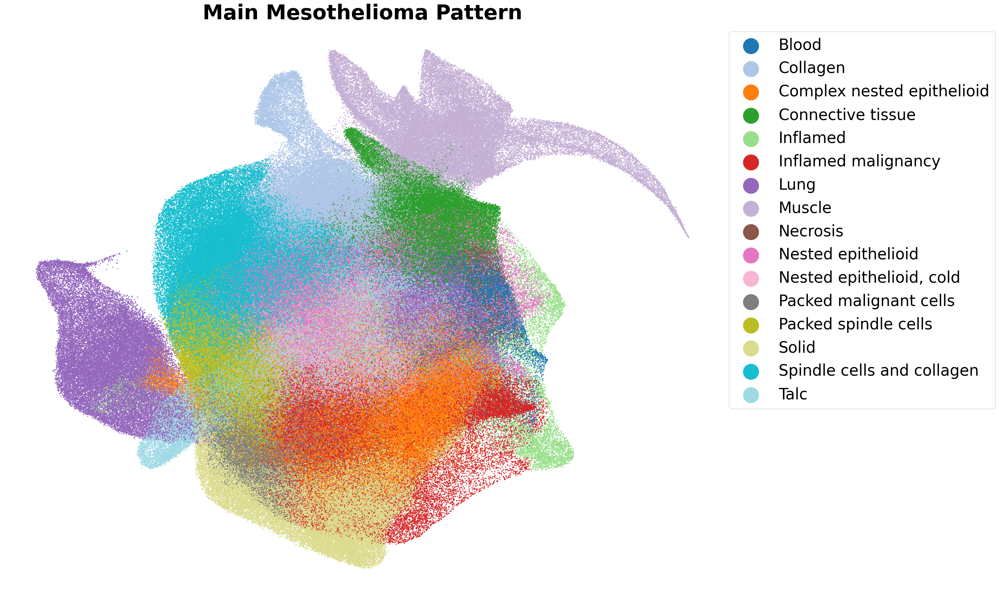

In [7]:
fig = plt.figure(figsize=(25,20))
# sns.set_theme(style='white')
# ax1  = fig.add_subplot(1, 3, 1)
# palette = ['#b4a7d6', '#9380c4', '#795ebf','#4821af']
# sc.pl.umap(adata_train, color='TILS', show=False, size=20,  frameon=False, palette=sns.color_palette(palette), ax=ax1, legend_fontsize=30)
# ax1.set_title('Tumor-infiltrating lymphocyte Degree', fontsize=40, fontweight='bold')
# ax1.legend(markerscale=5, loc='upper left', bbox_to_anchor=(1, 1), fontsize=30)

ax2  = fig.add_subplot(1, 1, 1)
sc.pl.umap(adata_train, color='main_pattern', show=False, size=20,  frameon=False, palette='tab20' , ax=ax2, legend_fontsize=30)
ax2.set_title('Main Mesothelioma Pattern', fontsize=40, fontweight='bold')
ax2.legend(markerscale=5, loc='upper left', bbox_to_anchor=(1, 1), fontsize=30)

# ax3  = fig.add_subplot(1, 3, 3)
# sc.pl.umap(adata_train, color='category', show=False, size=15,  frameon=False, palette='tab20b', ax=ax3)
# ax3.set_title('Mesothelioma Category (Super-Cluster)', fontsize=40, fontweight='bold')
# ax3.legend(markerscale=5, loc='upper left', bbox_to_anchor=(1, 1), fontsize=30)
plt.savefig(os.path.join(figure_path, 'til_pttrn_sprclstr_umap.png'), bbox_inches='tight', dpi=300)



# WSI visualization

Use the saved processed csvs for new plots if required, here: results/BarlowTwins_3/Meso_400_subsampled/h224_w224_n3_zdim128/meso_subtypes_nn400/leiden_2p0_fold0/figures

In [49]:
whole_dataset = 'Meso'
h5_path = '{}/results/BarlowTwins_3/{}/h224_w224_n3_zdim128/hdf5_{}_he_complete_metadata.h5'.format(main_path, whole_dataset, whole_dataset)
adatas_path_whole = '{}/results/BarlowTwins_3/{}/h224_w224_n3_zdim128/meso_subtypes_nn400/adatas'.format(main_path, whole_dataset)
annotations = pd.read_csv('%s/files/Meso_400_subsampled_annotations.csv'%main_path)
annotations.head(5)

,HPC,Summary,category,main_pattern
0,0,Cellular reactive stroma with very occasional ...,Tumour,Epithelioid
1,1,Hyalinised paucicellular stroma,Non-tumour,Non-tumour
2,2,Fibrin and granular debris,Non-tumour,Non-tumour
3,3,"Some stroma, some sarcomatoid, some epithelioi...",Tumour,Mixed
4,4,Adipose tissue,Non-tumour,Non-tumour


In [ ]:
# Dataset images.
from data_manipulation.data import Data
data = Data(dataset=whole_dataset, marker='he', patch_h=224, patch_w=224, n_channels=3, batch_size=64, project_path=main_path, load=True)
data_dicts = dict()

data_dicts['train'] = data.training.images
data_dicts['valid'] = data.validation.images
data_dicts['test']  = data.test.images

value_cluster_ids = dict()
value_cluster_ids[0] = []
value_cluster_ids[1] = [1]
only_id = True

# Read frames.
_, frame_whole, leiden_clusters_whole = read_csvs(adatas_path_whole, matching_field, groupby, fold_number, [[],[],[]], h5_path, None, additional_as_fold=False, force_fold=None)
colors = sns.color_palette('tab20', len(leiden_clusters_whole))
frame_whole['Meso_type'] = frame_whole['type'].apply(lambda x: 0 if x == 'Epithelioid' else 1)
slide_rep_df_whole = prepare_set_representation(frame_whole, matching_field, meta_field, groupby, leiden_clusters, type_='clr', min_tiles=100)

dropped_slides = ['MESO_471_1', 'MESO_471_2', 'MESO_471_3','MESO_322_16', 'MESO_46_7']
slide = dropped_slides[-2]
from models.visualization.clusters import get_wsi_arrays
wsi, wsi_c, slide_clusters = get_wsi_arrays(frame_whole, groupby, slide, img_size=224, downsample=2, img_dicts=data_dicts, colors=colors, pad_pixels=0, legend_margin=1000)
frame_whole


In [60]:
slide_rep_df_whole.to_csv(figure_path + '/%s_%s_slide_representations.csv' % (whole_dataset, meta_folder), index=True)
frame_whole.to_csv(figure_path + '/%s_%s_frame_representations.csv' % (whole_dataset, meta_folder), index=True)

In [ ]:
from models.visualization.clusters import get_wsi_arrays
from matplotlib.lines        import Line2D

for slide in dropped_slides:
    wsi, wsi_c, slide_clusters = get_wsi_arrays(frame_whole, groupby, slide, img_size=224, downsample=2, img_dicts=data_dicts, colors=colors, pad_pixels=0, legend_margin=1000)
    fontsize   = 30
    markersize = 15


    image_clusters, counts = np.unique(slide_clusters, return_counts=True)
    custom_lines = [Line2D([0], [0], color=colors[image_clusters[index]], lw=markersize) for index in np.argsort(-counts)]
    names_lines  = []
    for index in np.argsort(-counts):
        hpc = image_clusters[index]
        name = 'HPC %2s - Area(%s) %3s - %s' % (hpc, '%', np.round(slide_rep_df_whole.loc[slide,hpc]*100,1), annotations.loc[hpc, 'Summary'])
        names_lines.append(name)

    for (_wsi, wsi_name) in [(wsi,'wsi'), (wsi_c,'wsi_c')]:
        dpi = 100
        height, width, _ = _wsi.shape
        figsize = width / float(dpi), height / float(dpi)
        fig = plt.figure(figsize=figsize)
        ax  = fig.add_subplot(1, 1, 1)
        ax.imshow(_wsi/255.)
        ax.axis('off')


        legend = ax.legend(custom_lines, names_lines, title='Histomorphological Phenotype Cluster\n(HPC)', frameon=False, loc='lower left', 
                        prop={'weight':'bold', 'size':fontsize}, title_fontproperties={'weight':'bold', 'size':fontsize*1.1}, bbox_to_anchor=(.87, .4))

        # plt.show(fig)
        # save figure
        fig.savefig(figure_path + '/%s_%s_%s_legend.jpg' % (whole_dataset, meta_folder, wsi_name), bbox_inches='tight', pad_inches=0)


# gc.collect()

### Annotation Tables

In [120]:
import pandas as pd
import numpy as np


df1 = pd.read_excel(f'{main_path}/files/MM_cluster_annotation_form_v1_CR.xlsx', sheet_name='Sheet1', header=50, usecols='B:Y')
df1.iloc[-1, 0] = 46
df1.columns = [x+'_1' for x in df1.columns]
df1.rename(columns={'Cluster_1': 'HPC'}, inplace=True)

df2 = pd.read_excel(f'{main_path}/files/MM_cluster_annotation_form_v1_JLQ.xlsx', sheet_name='Sheet1', header=50, usecols='B:Y')
df2.columns = [x+'_2' for x in df2.columns]
df2.rename(columns={'Cluster_2': 'HPC'}, inplace=True)

df3 = pd.read_excel(f'{main_path}/files/MM_cluster_annotation_form_v1_SK.xlsx', sheet_name='Sheet1', header=50, usecols='B:Y')
df3.columns = [x+'_3' for x in df3.columns]
df3.rename(columns={'Cluster_3': 'HPC'}, inplace=True)

df_total = pd.merge(df1, df2, on='HPC', how='inner')
df_total = pd.merge(df_total, df3, on='HPC', how='inner')
df_total = df_total.applymap(lambda x: x.capitalize() if isinstance(x, str) else x)

df_total.to_csv(f'{figure_path}/meso_cluster_annotations.csv', index=False)

In [119]:
# Guide for the annotation.
def clean_array(x):
    xp = []
    for i in x:
        if not isinstance(i, float): 
            xp.append(i)
            # remove white spaces.
            xp = [x.strip() for x in xp]

    # remove any repeated values.
    xp = list(set(xp))
    return np.array(xp)

def list_to_string(x):
    return ', '.join(x)

option1_df = pd.read_excel(f'{main_path}/files/MM_cluster_annotation_form_v1_CR.xlsx', sheet_name='Sheet1', header=5, nrows=9)
option1_df['Types'] = [clean_array(x) for x in option1_df[['Options', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10']].to_numpy()]
option1_df = option1_df.drop(['Unnamed: 0', 'Unnamed: 4', 'Option 1 - Epithelioid tumour', 'Unnamed: 2', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10', 'Options'], axis=1)


option2_df = pd.read_excel(f'{main_path}/files/MM_cluster_annotation_form_v1_CR.xlsx', sheet_name='Sheet1', header=17, nrows=8)
option2_df['Types'] = [clean_array(x) for x in option2_df[['Options', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10']].to_numpy()]
option2_df = option2_df.drop(['Unnamed: 0', 'Unnamed: 4', 'Option 2 - Spindle cells / extracellular matrix', 'Unnamed: 2', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10', 'Options'], axis=1)

option3_df = pd.read_excel(f'{main_path}/files/MM_cluster_annotation_form_v1_CR.xlsx', sheet_name='Sheet1', header=28, nrows=6)
option3_df['Types'] = [clean_array(x) for x in option3_df[['Options', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13']].to_numpy()]
option3_df = option3_df.drop(['Unnamed: 0', 'Unnamed: 4', 'Option 3 - Non-tumour', 'Unnamed: 2', 'Unnamed: 6', 'Unnamed: 7', 'Unnamed: 8', 'Unnamed: 9', 'Unnamed: 10', 'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13', 'Options'], axis=1)

# Save the annotation guide.
option1_df.to_csv(f'{figure_path}/option1.csv', index=False)
option2_df.to_csv(f'{figure_path}/option2.csv', index=False)
option3_df.to_csv(f'{figure_path}/option3.csv', index=False)


In [118]:
voting_df = pd.DataFrame()

# Infllamation degree.
Inflammation = df_total[['Inflammation*_1', 'Inflammation*.1_1', 'Inflammation*.2_1', 'Inflammation*_2', 'Inflammation*.1_2', 'Inflammation*.2_2', 'Inflammation*_3', 'Inflammation*.1_3', 'Inflammation*.2_3' ]]
voting_df['inflammation'] = [clean_array(x) for x in Inflammation.mode(axis=1)[[0,1,2]].to_numpy()]


# Necrosis degree.
Necrosis = df_total[['Necrosis**_1', 'Necrosis**.1_1', 'Necrosis**.2_1', 'Necrosis**_2', 'Necrosis**.1_2', 'Necrosis**.2_2', 'Necrosis**_3', 'Necrosis**.1_3', 'Necrosis**.2_3' ]]
voting_df['necrosis'] = [clean_array(x) for x in Necrosis.mode(axis=1)[[0,1]].to_numpy()]


# Stromal cellularity degree.
Stromal_cellularity = df_total[['Stromal cellularity***_1', 'Stromal cellularity***_2', 'Stromal cellularity***_3']]
voting_df['stromal_cellularity'] = [clean_array(x) for x in Stromal_cellularity.mode(axis=1)[[0,1]].to_numpy()]

# epith_growth_pattern.
epith_growth_pattern = df_total[['Predominant architectural growth pattern_1', 'Second most predominant pattern_1', 'Predominant architectural growth pattern_2', 'Second most predominant pattern_2', 'Predominant architectural growth pattern_3', 'Second most predominant pattern_3']]
voting_df['epith_growth_pattern'] = [clean_array(x) for x in epith_growth_pattern.mode(axis=1)[[0,1]].to_numpy()]

# spindle tiles architecture.
spindle_arch = df_total[['Architecture_1', 'Architecture_2', 'Architecture_3']]
voting_df['spindle_arch'] = [clean_array(x) for x in spindle_arch.mode(axis=1)[[0,1,2]].to_numpy()]

spidle_cellularity = df_total[['Cellularity_1', 'Cellularity_2', 'Cellularity_3']]
voting_df['spindle_cellularity'] = [clean_array(x) for x in spidle_cellularity.mode(axis=1)[[0,1]].to_numpy()]

desmoplastic_component = df_total[['Desmoplastic_1', 'Desmoplastic_2', 'Desmoplastic_3']]
voting_df['desmoplastic_component'] = [clean_array(x) for x in desmoplastic_component.mode(axis=1)[[0]].to_numpy()]

# Non-tumour tiles architecture.
non_tumour_tiles = df_total[['Tiles contain mostly (by area)_1', 'Second most common feature (by area)_1', 'Tiles contain mostly (by area)_2', 'Second most common feature (by area)_2', 'Tiles contain mostly (by area)_3', 'Second most common feature (by area)_3']]
voting_df['non_tumour_tiles'] = [clean_array(x) for x in non_tumour_tiles.mode(axis=1)[[0,1,2,3]].to_numpy()]

# Nuclear atypia degree.
Nuclear_atypia = df_total[['Nuclear atypia_1', 'Nuclear atypia.1_1', 'Nuclear atypia_2', 'Nuclear atypia.1_2', 'Nuclear atypia_3', 'Nuclear atypia.1_3']]
voting_df['nucl_atypia'] = [clean_array(x) for x in Nuclear_atypia.mode(axis=1)[[0,1,2]].to_numpy()]

# Percentage cluster purity
cluster_purity = df_total[['Percentage cluster purity_1', 'Percentage cluster purity_2', 'Percentage cluster purity_3']]
voting_df['cluster_purity'] = [clean_array(x) for x in cluster_purity.mode(axis=1)[[0,1,2]].to_numpy()]
voting_df = voting_df.applymap(lambda x: list_to_string(x))
voting_df.to_csv(figure_path + '/annotation_voting_df.csv', index=True)

Clsuters: 39[Tubular] - 27[Solid] - 24[Tubular] - 6[Solid/Trabecular]

### TCGA Grading

In [33]:
df_grades.columns

Index(['patterns', 'case_Id', 'Subtype', 'Nuclear atypia',
       'Mitosis (per 2mm2)', 'Presence of necrosis', 'Sum', 'Overall grade',
       'os_event_data', 'os_event_ind', '0', '1', '2', '3', '4', '5', '6', '7',
       '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19',
       '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31',
       '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43',
       '44', '45', '46', 'Stage', 'Sex', 'age', 'Meso_type'],
      dtype='object')

In [23]:
df_grades['Meso_type'].value_counts()

Meso_type
0    52
1     3
Name: count, dtype: int64

In [24]:
import pandas as pd
import numpy as np

main_path = '/nfs/home/users/fshahi/Projects/Histomorphological-Phenotype-Learning'
event_ind_field = 'os_event_ind'
event_data_field = 'os_event_data'
# resolution = 2.0
# groupby        = 'leiden_%s' % resolution
# fold_number = 4

df_grades = pd.read_excel(f'{main_path}/files/TCGA_files/TCGA_meso_grading_JLQ_KR.xlsx', header=4, usecols='A:H')
df_grades = df_grades.dropna()

df_hpl = pd.read_csv(f'{main_path}/results/BarlowTwins_3/Meso/h224_w224_n3_zdim128/750K/survival_csvs/clr_leiden_2p0_fold4_additional_metadata.csv', index_col=0)
df_hpl.os_event_ind = df_hpl.os_event_ind.astype(float)
df_hpl.os_event_data = df_hpl.os_event_data.astype(float)
features = [x for x in df_hpl.columns.to_list() if x.isdigit()]
df_grades=df_grades.merge(df_hpl, on='case_Id', how='inner')


columns = ['Meso_type']
df_grades['Overall grade'] = df_grades['Overall grade'].apply(lambda x: 0 if x == 'Low' else 1)
df_grades['Sex'] = df_grades['Sex'].apply(lambda x: 0 if x == 'male' else 1)

other_columns = set(df_grades.columns.to_list()) - set(columns) - set([event_data_field, event_ind_field])
# df_grades = pd.get_dummies(df_grades, columns=columns)


# cox model on just the grades.
from lifelines import CoxPHFitter
cph = CoxPHFitter()
columns_cph = list(set(df_grades.columns.to_list()) - other_columns)
print(columns_cph)
cph.fit(df_grades[columns_cph], duration_col=event_data_field, event_col=event_ind_field)
cph.print_summary()


# kaplan meier plot.    
# from lifelines import KaplanMeierFitter
# kmf = KaplanMeierFitter()
# T = df_grades[event_data_field]
# E = df_grades[event_ind_field]
# groups = df_grades['Overall grade']
# ix = (groups == 0)
# kmf.fit(T[ix], E[ix], label='Low Grade')
# ax = kmf.plot()
# ix = (groups == 1)
# kmf.fit(T[ix], E[ix], label='High Grade')
# kmf.plot(ax=ax)
# # add p-value.
# from lifelines.statistics import logrank_test
# results = logrank_test(T[groups == 0], T[groups == 1], E[groups == 0], E[groups == 1], alpha=.99)
# results.print_summary()


['os_event_ind', 'os_event_data', 'Meso_type']


<lifelines.CoxPHFitter: fitted with 55 total observations, 8 right-censored observations>
             duration col = 'os_event_data'
                event col = 'os_event_ind'
      baseline estimation = breslow
   number of observations = 55
number of events observed = 47
   partial log-likelihood = -156.90
         time fit was run = 2024-09-23 09:08:05 UTC

---
            coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                         
Meso_type   0.88       2.41       0.61            -0.32             2.08                 0.73                 7.99

            cmp to    z    p   -log2(p)
covariate                              
Meso_type     0.00 1.44 0.15       2.73
---
Concordance = 0.52
Partial AIC = 315.80
log-likelihood ratio test = 1.65 on 1 df
-log2(p) of ll-ratio test = 2.33

### Load WSI

In [1]:
from skimage.transform import resize
''' ###### Visualize WSI Cluster Samples ######### '''
def apply_mask(image, mask, color, alpha=0.5):
    for c in range(3):
        image[:, :, c] = image[:, :, c] * (1 - alpha * mask) + alpha * mask * color[c] * 255
    return image


# Get tile information.
def get_x_y(tile_info):
    if '.' in str(tile_info):
        string = tile_info.split('.')[0]
    else:
        string = str(tile_info)
    # if TCGA-MESO put - instead of _.
    x, y   = string.split('-')
    return int(x),int(y)
    
def get_wsi_arrays(frame, groupby, slide, img_size, downsample, img_dicts, colors, pad_pixels=50, legend_margin=1000):
    slide_indices  = frame[frame[matching_field]==slide].indexes.values.tolist()
    slide_tiles    = frame[frame[matching_field]==slide].tiles.values.tolist()
    slide_sets     = frame[frame[matching_field]==slide].original_set.values.tolist()
    slide_clusters = frame[frame[matching_field]==slide][groupby].values.tolist()

    # Get size of the WSI.
    # print('\t\tSlide %s: %s' % (slide, len(slide_indices)))
    y,x = get_x_y(slide_tiles[0])
    x_min = x
    x_max = x
    y_min = y
    y_max = y
    for i in slide_tiles:
        y_i, x_i  = get_x_y(i)
        x_min = min(x_min, x_i)
        y_min = min(y_min, y_i)
        x_max = max(x_max, x_i)
        y_max = max(y_max, y_i)
    x_max += 1
    y_max += 1

    wsi_x = int(x_max*img_size//downsample)
    wsi_y = int(y_max*img_size//downsample)

    # Original 5x.
    wsi   = np.ones((wsi_x, wsi_y, 3), dtype=np.uint8)*255
    wsi_c = np.ones((wsi_x, wsi_y, 3), dtype=np.uint8)*255
    print('\t\tWhole Slide Image Resolution %s: (%s, %s)' % (slide, wsi_x, wsi_y))

    for index, tile, original_set, cluster in zip(slide_indices, slide_tiles, slide_sets, slide_clusters):
        y_i, x_i  = get_x_y(tile)
        x_i *= img_size//downsample
        y_i *= img_size//downsample
        tile_img = img_dicts[original_set][int(index)]
        tile_img = np.array(resize(tile_img, (tile_img.shape[0]//downsample, tile_img.shape[1]//downsample), anti_aliasing=True), dtype=float)
        tile_img = (tile_img*255).astype(np.uint8)

        if cluster == 'Others':
            # color = colors[-1]
            # color = colors[cluster]
            color = (1.0, 1.0, 1.0)
        else:
            # color = colors[int(cluster)]
            color = colors[cluster]
        mask  = np.ones((img_size//downsample,img_size//downsample))

        wsi[x_i:x_i+(img_size//downsample), y_i:y_i+(img_size//downsample), :]   = tile_img
        wsi_c[x_i:x_i+(img_size//downsample), y_i:y_i+(img_size//downsample), :] = apply_mask(tile_img, mask, color, alpha=0.5)

    wsi_padded = np.pad(wsi[:, :, 0], ((pad_pixels, pad_pixels), (pad_pixels, pad_pixels+legend_margin)), 'maximum')
    wsi_padded_total = np.zeros(list(wsi_padded.shape) + [3])
    wsi_padded_total[:, :, 0] = wsi_padded
    wsi_padded_total[:, :, 1] = np.pad(wsi[:, :, 1], ((pad_pixels, pad_pixels), (pad_pixels, pad_pixels+legend_margin)), 'maximum')
    wsi_padded_total[:, :, 2] = np.pad(wsi[:, :, 2], ((pad_pixels, pad_pixels), (pad_pixels, pad_pixels+legend_margin)), 'maximum')

    wsi_padded = np.pad(wsi_c[:, :, 0], ((pad_pixels, pad_pixels), (pad_pixels, pad_pixels+legend_margin)), 'maximum')
    wsi_c_padded_total = np.zeros(list(wsi_padded.shape) + [3])
    wsi_c_padded_total[:, :, 0] = wsi_padded
    wsi_c_padded_total[:, :, 1] = np.pad(wsi_c[:, :, 1], ((pad_pixels, pad_pixels), (pad_pixels, pad_pixels+legend_margin)), 'maximum')
    wsi_c_padded_total[:, :, 2] = np.pad(wsi_c[:, :, 2], ((pad_pixels, pad_pixels), (pad_pixels, pad_pixels+legend_margin)), 'maximum')
    return wsi_padded_total, wsi_c_padded_total, slide_clusters


In [2]:
# Images
main_path = '/mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning'
import sys
import h5py
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
sys.path.append(main_path)
from data_manipulation.data import Data
data = Data(dataset='TCGA_MESO', marker='he', patch_h=224, patch_w=224, n_channels=3, batch_size=64, project_path=main_path, load=True)
data_dicts = dict()

data_dicts['train'] = data.training.images
data_dicts['valid'] = data.validation.images
data_dicts['test']  = data.test.images

TCGA_MESO


In [3]:
h5_file = '/nfs/home/users/fshahi/Projects/Histomorphological-Phenotype-Learning/results/BarlowTwins_3/TCGA_MESO/h224_w224_n3_zdim128/hdf5_TCGA_MESO_he_complete.h5'
h5_image = h5py.File(h5_file, 'r')
df = pd.DataFrame()
df['indexes'] = h5_image['indexes'][:].astype(int)
df['slides'] = h5_image['slides'][:].astype(str)
df['tiles'] = h5_image['tiles'][:].astype(str)
df['original_set'] = h5_image['original_set'][:].astype(str)

In [4]:
frame_cluster = pd.read_csv('/nfs/home/users/fshahi/Projects/Histomorphological-Phenotype-Learning/results/BarlowTwins_3/Meso/h224_w224_n3_zdim128/750K/adatas/TCGA_MESO_he_complete_filtered_metadata_leiden_2p0__fold4.csv')
df_tile_slide_set = frame_cluster[['leiden_2.0','slides', 'tiles']]

groupby = 'leiden_2.0'
Id = 'TCGA-3U-A98F'
figure_path = main_path + '/workflow/figures/HPC_figures/'
slides = frame_cluster[frame_cluster['case_Id'] == Id].slides.unique()
print('Slides:', slides)
case_Id = slides[0]
matching_field = 'slides'
temp = df_tile_slide_set[df_tile_slide_set[matching_field] == case_Id]
top_hpcs = temp[groupby].value_counts().head(10)
temp = temp[temp[groupby].isin(top_hpcs.index.values)]

case_Id_df = df[df[matching_field] == case_Id]
case_Id_df = case_Id_df.merge(temp, on=['slides', 'tiles'], how='outer')
case_Id_df[groupby] = case_Id_df[groupby].fillna('Others')

# colors
colors = sns.color_palette('tab20', len(top_hpcs)+1)
color_map = dict(zip(top_hpcs.index.tolist(), colors))

Slides: ['TCGA-3U-A98F-01Z-00-DX1']


In [5]:
wsi, wsi_c, slide_clusters = get_wsi_arrays(case_Id_df, groupby, case_Id, img_size=224, downsample=2, img_dicts=data_dicts, colors=color_map, pad_pixels=0, legend_margin=100)
fontsize   = 30
markersize = 15
image_clusters, counts = np.unique(slide_clusters, return_counts=True)

		Whole Slide Image Resolution TCGA-3U-A98F-01Z-00-DX1: (5824, 6048)


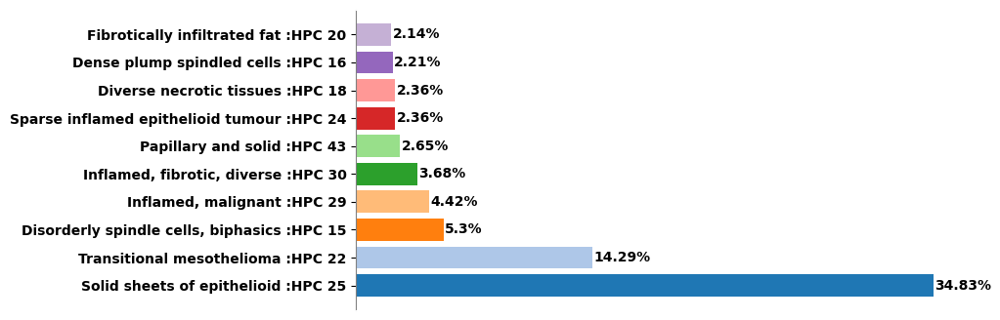

In [6]:
# import textwrap
annotations = pd.read_csv('{}/files/meso_annotations_750K.csv'.format(main_path), index_col=0).reset_index()
plt_labels, plt_colors = [], []
for hpc in top_hpcs.index.tolist():
    color = color_map[hpc]       
    # ann_hpc = textwrap.fill(annotations[annotations['HPC'] == hpc]['Summary'].values[0] + ' ({})'.format(annotations[annotations['HPC'] == hpc]['main_pattern'].values[0]), width=80)
    ann_hpc = annotations[annotations['HPC'] == hpc]['Summary'].values[0]
    ratio = case_Id_df[case_Id_df[groupby]==hpc].shape[0]/case_Id_df.shape[0]
    name = '%s :HPC %2s' % (ann_hpc, hpc)
    plt_labels.append(name)
    plt_colors.append(color)


fig = plt.figure(figsize=(8,4))
ax = fig.add_subplot(1, 1, 1)
ax.barh(range(len(top_hpcs.values)), top_hpcs.values, color=plt_colors)
for i, v in enumerate(top_hpcs.values):
    ax.text(v+1, i, str(np.round(v/sum(counts)*100, 2)) + '%', ha='left', va='center', fontsize=10, fontweight='bold')
ax.set_yticks(range(len(top_hpcs.values)), plt_labels, fontweight='bold');
ax.spines['left'].set_color('gray')
ax.spines['right'].set_color('white')
ax.spines['top'].set_color('white')
ax.spines['bottom'].set_color('white')
ax.get_xaxis().set_visible(False)
plt.savefig(f'{figure_path}/top_hpcs_{case_Id}.png', bbox_inches='tight', dpi=300)

In [8]:
# fig = plt.figure(figsize=(30,30))
for (_wsi, wsi_name) in [(wsi,'wsi'), (wsi_c,'wsi_overlay')]:
    dpi = 100
    height, width, _ = _wsi.shape
    figsize = width / float(dpi), height / float(dpi)
    fig = plt.figure(figsize=figsize)
    ax  = fig.add_subplot(1, 1, 1) 
    ax.imshow(_wsi/255.)
    ax.axis('off')

    # plt.show(fig)
    # plt.close(fig)
    plt.savefig(f'{figure_path}/{wsi_name}_{case_Id}.png', bbox_inches='tight', dpi=dpi)
    plt.close(fig)

### Tile Images

In [ ]:
import h5py
import matplotlib.pyplot as plt
import numpy as np
main_path = '/mnt/cephfs/sharedscratch/users/fshahi/Projects/Histomorphological-Phenotype-Learning'
import sys
sys.path.append(main_path)
from models.clustering.data_processing import *

h5_complete_path = '{}/results/BarlowTwins_3/{}/h224_w224_n3_zdim128/hdf5_{}_he_complete_filtered_metadata.h5'.format(main_path, 'Meso', 'Meso')
meta_folder = '750K'
groupby = 'leiden_2.0'
fold_number = 4
figure_path = main_path + '/workflow/figures/HPC_figures/'
adata_train, h5ad_path = read_h5ad_reference(h5_complete_path, meta_folder, groupby, fold_number)



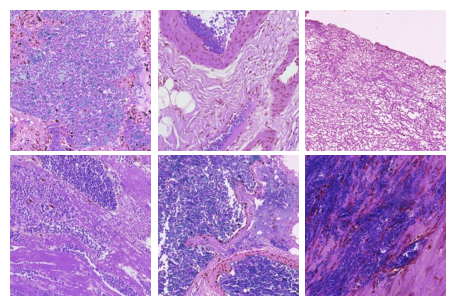

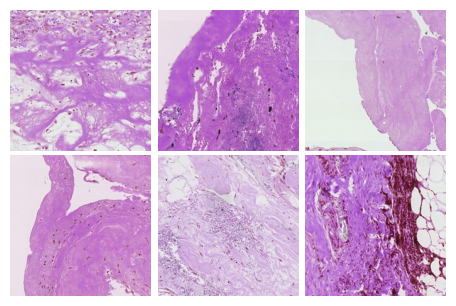

In [42]:
# cluster_set = ['13', '15', '21', '38']
# fldr_nm = 'desmoplastic_component'

# cluster_set = ['18']
# cluster_set = ['11', '29', '40', '41', '46']
# fldr_nm = 'necrosis'



os.makedirs(figure_path + '/{}'.format(fldr_nm), exist_ok=True)

for cluster_number in cluster_set:
    im_list = []
    indexes, sets = adata_train[adata_train.obs[groupby] == cluster_number].obs['indexes'], adata_train[adata_train.obs[groupby] == cluster_number].obs['original_set']
    for i in range(6):
        i_rand = np.random.randint(0, len(indexes))
        index_ = indexes[i_rand]
        set_ = sets[i_rand]
        if set_ == 'valid': set_address = 'validation' 
        else: set_address = set_
        h5_image_path = h5_complete_path.split('results/')[0] + 'datasets/{}/he/patches_h224_w224/hdf5_Meso_he_{}.h5'.format('Meso', set_address)
        h5_image = h5py.File(h5_image_path, 'r')
        im_list.append((h5_image['{}_img'.format(set_)][int(index_)], cluster_number))
    

    #  2*2 grid. 4 tile for each cluster.
    fig, ax = plt.subplots(2, 3, figsize=(4.5,3))
    ax = ax.flatten()
    for i, (image, cluster_number) in enumerate(im_list):
        ax[i].imshow(image)
        ax[i].axis('off')
    # fig.suptitle('HPC %s' % cluster_number, fontsize=15, fontweight='bold')
    plt.tight_layout(pad=0.5, h_pad=0.5, w_pad=0.5)
    plt.savefig(figure_path + '/{}/HPC_{}_tiles_some.png'.format(fldr_nm, cluster_number), bbox_inches='tight', dpi=300)

h5_image.close()
plt.show()
